In [2]:
%load_ext autoreload
%autoreload 2
import os
# Set environment variables
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".99"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import jax
# from jax import config
# config.update('jax_enable_x64', True)

# Check JAX configuration
devices = jax.local_devices()
print(devices)
print(jax.default_backend())
print(jax.devices())


from model import EF, train_model
from model import dipole_calc
import jax
import optax
import e3x

from dcmnet.analysis import create_model_and_params
from dcmnet.data import prepare_batches, prepare_datasets
import numpy as np

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[CpuDevice(id=0)]
cpu
[CpuDevice(id=0)]


<Figure size 100x100 with 0 Axes>

In [10]:
import ase
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

def plot(x, y, ax, units="kcal/mol", _property="", kde=True, s=1):
    x = x.flatten()
    y = y.flatten()
    ERROR = x - y
    RMSE = np.mean(ERROR**2)**0.5
    MAE = np.mean(abs(ERROR))
    ax.set_aspect("equal")
    ax.text(0.3, 0.85, f"{RMSE:.2f}/{MAE:.2f}\n[{units}]", 
            transform=ax.transAxes, ha='center', va='center')
    if kde:
        if kde == "y":
            xy = np.vstack([y])
        else:
            # Calculate the point density
            xy = np.vstack([x,y])
        z = gaussian_kde(xy[:,::10])(xy)
        # Sort the points by density (optional, for better visualization)
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]
    else:
        z = "k"
    ax.scatter(x, y, alpha=0.8, c=z, s=s)
    # plt.scatter(Fs, predFs, alpha=1, color="k")
    ax.set_aspect("equal")
    x_min, x_max = min(x), max(x)
    y_min, y_max = min(y), max(y)
    ax.set_ylim(min(x_min, y_min), max(x_max, y_max))
    ax.set_xlim(min(x_min, y_min), max(x_max, y_max))
    ax.set_title(_property)
    ax.set_xlabel(f"ref. [{units}]")
    ax.set_ylabel(f"pred. [{units}]")
    ax.plot([0,1],[0,1],transform=ax.transAxes, color="gray")
    return ax

def eval(batches, model, params, batch_size=500):
    Es, Eeles, predEs, Fs, predFs, Ds, predDs, charges, outputs = [], [], [], [], [], [], [], [], []
    for i, batch in enumerate(batches):
      output = model.apply(
        params,
        atomic_numbers=batch['Z'],
        positions=batch['R'],
        dst_idx=batch['dst_idx'],
        src_idx=batch['src_idx'],
        batch_segments=batch['batch_segments'],
        batch_size=batch_size
      )
      Ds.append(batch["D"])
      D = dipole_calc(batch["R"], batch["Z"], output["charges"],batch['batch_segments'],batch_size)
      # print(D,batch["D"])
      predDs.append(D)
      Es.append(batch["E"])
      predEs.append(output["energy"])
      Fs.append(batch["F"])
      predFs.append(output["forces"])
      charges.append(output["charges"])
      Eeles.append(output["electrostatics"])
    Es = np.array(Es).flatten()
    Eeles = np.array(Eeles).flatten()
    predEs = np.array(predEs).flatten()
    Fs = np.array(Fs).flatten()
    predFs = np.array(predFs).flatten()
    Ds = np.array(Ds) #.flatten()
    predDs = np.array(predDs) #.flatten()
    outputs.append(output)
    return Es, Eeles, predEs, Fs, predFs, Ds, predDs, charges, outputs

def plot_stats(batches, model, params, _set="", do_kde=False, batch_size=500):
    Es, Eeles, predEs, Fs, predFs, \
        Ds, predDs, charges, outputs  = eval(batches, model, params)
    charges = np.concatenate(charges)
    # Es = Es /(ase.units.kcal/ase.units.mol)
    # predEs = predEs /(ase.units.kcal/ase.units.mol)
    # Fs = Fs /(ase.units.kcal/ase.units.mol)
    # predFs = predFs /(ase.units.kcal/ase.units.mol)
    # Eeles = Eeles/(ase.units.kcal/ase.units.mol)
    summed_q = charges.reshape(len(batches)*batch_size, NATOMS).sum(axis=1)
    
    fig, axes = plt.subplots(2, 3, figsize=(13,7.5))
    plot(Es, predEs, axes[0,0], _property="$E$", s=10,kde=do_kde)
    plot(Fs, predFs, axes[0,1],_property="$F$",kde=do_kde)
    plot(Ds, predDs, axes[0,2],_property="$D$", units="$e \AA$",kde=do_kde)
    plot(Es, 
         Eeles, 
         axes[1,0],_property="$E$ vs $E_{\\rm ele}$",kde=do_kde)
    axes[1,1].axis("off")
    q_sum_kde = "y" if do_kde else False
    plot(np.zeros_like(summed_q), summed_q, axes[1,2], 
         _property="$Q$", units="$e$",kde=q_sum_kde)
    plt.subplots_adjust(hspace=0.55)
    plt.suptitle(_set+f" (n={len(predEs.flatten())})", fontsize=20)
    plt.show()

In [11]:
data_key, train_key = jax.random.split(
    jax.random.PRNGKey(43), 2)

In [12]:
files = ["/pchem-data/meuwly/boittier/home/ini.to.dioxi.npz"]

In [13]:
NATOMS = 8

In [14]:
train_data, valid_data = prepare_datasets(data_key, 7732-1000, 1000,
                                          files, 
                                          clip_esp=False, natoms=NATOMS, clean=False)

shape (7732, 8, 3) not failed [   0    1    2 ... 7729 7730 7731]
dataR (7732, 8, 3)
D (7732, 3)
Q 1 (7732,) 7732
Q (7732,)
R (7732, 8, 3)
(7732, 8, 3)
['R', 'Z', 'F', 'E', 'N', 'D', 'Q']
7732
0 R 7732 (7732, 8, 3)
1 Z 7732 (7732, 8)
2 F 7732 (7732, 8, 3)
3 E 7732 (7732, 1)
4 N 7732 (7732, 1)
5 D 7732 (7732, 3)
6 Q 7732 (7732,)


In [15]:
N = 5500
test_data = {k: v[N:] for k,v in train_data.items()}
train_data = {k: v[:N] for k,v in train_data.items()}


In [16]:
model = EF(
    # attributes
    features = 128,
    max_degree = 0,
    num_iterations = 5,
    num_basis_functions = 64,
    cutoff = 10.0,
    max_atomic_number = 9,
    charges = True,
    natoms=NATOMS,
    total_charge=0,
    n_res=3,
)
model

EF(
    # attributes
    features = 128
    max_degree = 0
    num_iterations = 5
    num_basis_functions = 64
    cutoff = 10.0
    max_atomic_number = 9
    charges = True
    natoms = 8
    total_charge = 0
    n_res = 3
)

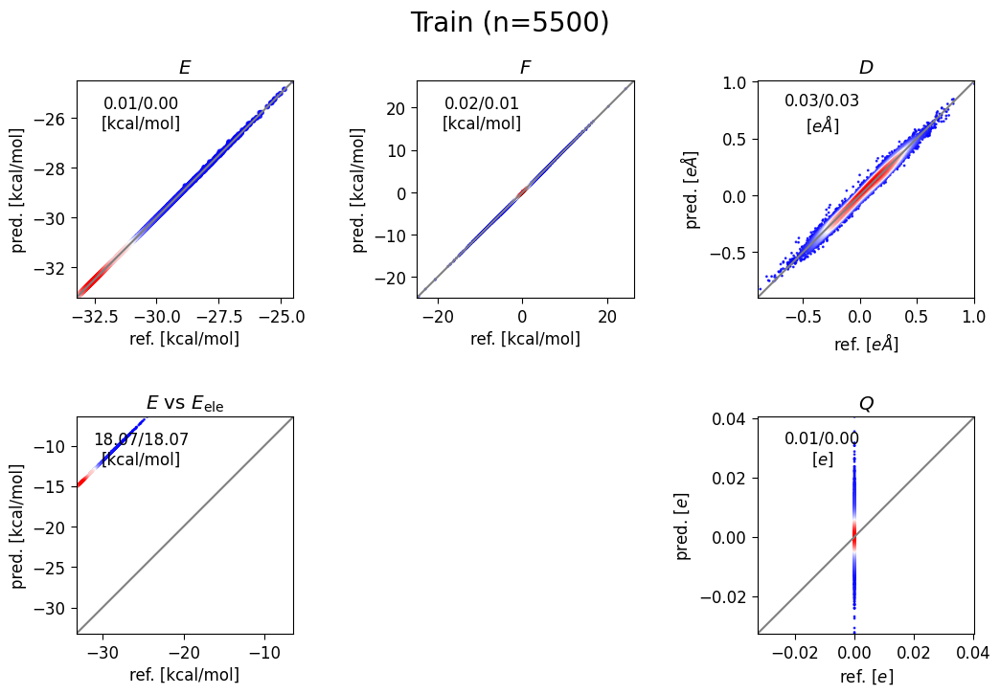

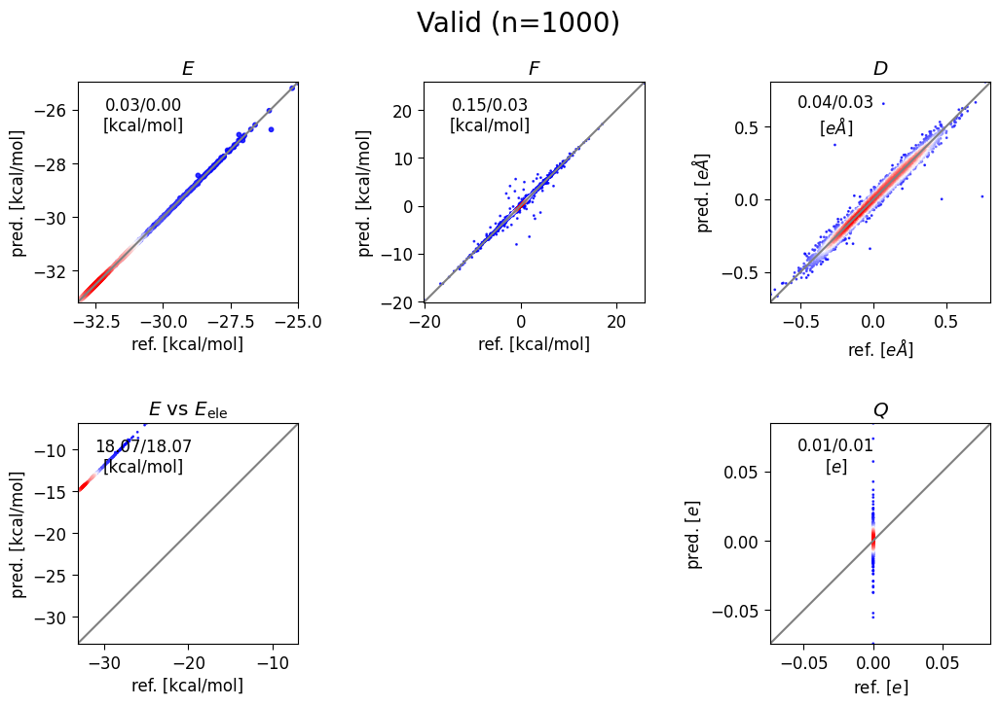

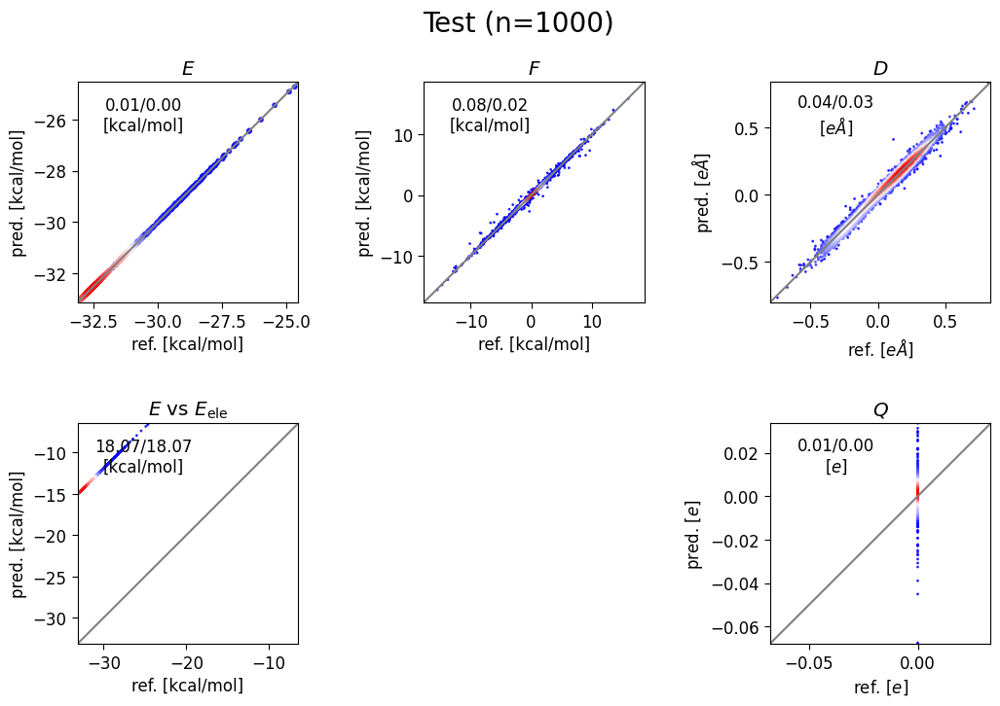

In [17]:
import pandas as pd


data_keys = ["R", "Z", "F", "E", "D", "dst_idx", "src_idx", "batch_segments"]

batch_size = 500
test_batches = prepare_batches(data_key, test_data, batch_size,
                              num_atoms=NATOMS, 
                              data_keys=data_keys)

train_batches = prepare_batches(data_key, train_data, batch_size,
                              num_atoms=NATOMS, 
                              data_keys=data_keys)

valid_batches = prepare_batches(data_key, valid_data, batch_size,
                              num_atoms=NATOMS, 
                              data_keys=data_keys)

params = pd.read_pickle("checkpoints/diox-q3.2.pkl")

plot_stats(train_batches, model, params, _set="Train", 
           do_kde=True, batch_size=batch_size)
plot_stats(valid_batches, model, params, _set="Valid", 
           do_kde=True, batch_size=batch_size)
plot_stats(test_batches, model, params, _set="Test", 
           do_kde=True, batch_size=batch_size)

In [63]:
import pickle
with open(f"checkpoints/diox-q.pkl", "wb") as file:
    pickle.dump(params, file)

In [64]:
import io
import ase
import ase.calculators.calculator as ase_calc
import ase.io as ase_io
from ase.md.velocitydistribution import MaxwellBoltzmannDistribution, Stationary, ZeroRotation
from ase.md.verlet import VelocityVerlet
import ase.optimize as ase_opt
import matplotlib.pyplot as plt
import py3Dmol

In [161]:
@jax.jit
def evaluate_energies_and_forces(atomic_numbers, positions, dst_idx, src_idx):
  return model.apply(params,
    atomic_numbers=atomic_numbers,
    positions=positions,
    dst_idx=dst_idx,
    src_idx=src_idx,
  )


class MessagePassingCalculator(ase_calc.Calculator):
  implemented_properties = ["energy", "forces", "dipole"]

  def calculate(self, atoms, properties, system_changes = ase.calculators.calculator.all_changes):
    ase_calc.Calculator.calculate(self, atoms, properties, system_changes)
    dst_idx, src_idx = e3x.ops.sparse_pairwise_indices(len(atoms))
    output = evaluate_energies_and_forces(
      atomic_numbers=atoms.get_atomic_numbers(),
      positions=atoms.get_positions(),
      dst_idx=dst_idx,
      src_idx=src_idx
    )

    dipole = dipole_calc(atoms.get_positions(), 
                         atoms.get_atomic_numbers(), 
                         output["charges"],
                np.zeros_like(atoms.get_atomic_numbers()),
                1)
    self.results["dipole"] = dipole
    self.results['energy'] = output["energy"].squeeze() #* (ase.units.kcal/ase.units.mol)
    self.results['forces'] = output["forces"] #* (ase.units.kcal/ase.units.mol) #/ase.units.Angstrom

In [162]:
# Initialize atoms object and attach calculator.
i = 0

Natoms = int(train_data['N'][i])
R = train_data['R'][i][:Natoms] - np.mean(train_data['R'][i][:Natoms], axis=0)
# print(R)
atoms = ase.Atoms(train_data['Z'][i][:Natoms], R )
atoms.set_calculator(MessagePassingCalculator())

# Write structure to xyz file.
xyz = io.StringIO()
ase_io.write(xyz, atoms, format='xyz')

# Visualize the structure with py3Dmol.
view = py3Dmol.view()
view.addModel(xyz.getvalue(), 'xyz')
view.setStyle({'stick': {'radius': 0.15}, 'sphere': {'scale': 0.25}})
view.show()



3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [207]:
# Run structure optimization with BFGS.
_ = ase_opt.BFGS(atoms).run(fmax=0.01)

      Step     Time          Energy          fmax
BFGS:    0 23:21:40      -31.363476        3.911362
BFGS:    1 23:21:40      -31.540333        2.395479
BFGS:    2 23:21:40      -31.655643        1.140761
BFGS:    3 23:21:40      -31.737686        0.820295
BFGS:    4 23:21:40      -31.763494        0.699147
BFGS:    5 23:21:40      -31.784958        0.299022
BFGS:    6 23:21:40      -31.791115        0.224325
BFGS:    7 23:21:40      -31.795471        0.171717
BFGS:    8 23:21:40      -31.797699        0.134669
BFGS:    9 23:21:40      -31.799366        0.120344
BFGS:   10 23:21:40      -31.800615        0.122059
BFGS:   11 23:21:40      -31.802551        0.125489
BFGS:   12 23:21:40      -31.802704        0.096038
BFGS:   13 23:21:40      -31.803053        0.053669
BFGS:   14 23:21:40      -31.803337        0.058829
BFGS:   15 23:21:40      -31.803791        0.066418
BFGS:   16 23:21:40      -31.804279        0.067088
BFGS:   17 23:21:40      -31.804813        0.049983
BFGS:   18 23:

In [208]:
print(atoms.get_dipole_moment())

# Write structure to xyz file.
xyz = io.StringIO()
ase_io.write(xyz, atoms, format='xyz')

# Visualize the structure with py3Dmol.
view = py3Dmol.view()
view.addModel(xyz.getvalue(), 'xyz')
view.setStyle({'stick': {'radius': 0.15}, 'sphere': {'scale': 0.25}})
view.show()

[[-0.20010793  0.02925952  0.26624763]]


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [209]:
# Parameters.
temperature = 500
timestep_fs = 0.5
num_steps = 100_000

# Draw initial momenta.
MaxwellBoltzmannDistribution(atoms, temperature_K=temperature)
Stationary(atoms)  # Remove center of mass translation.
ZeroRotation(atoms)  # Remove rotations.

# Initialize Velocity Verlet integrator.
integrator = VelocityVerlet(atoms, timestep=timestep_fs*ase.units.fs)

# Run molecular dynamics.
frames = np.zeros((num_steps, len(atoms), 3))
dipoles = np.zeros((num_steps, 1, 3))
potential_energy = np.zeros((num_steps,))
kinetic_energy = np.zeros((num_steps,))
total_energy = np.zeros((num_steps,))
for i in range(num_steps):
  # Run 1 time step.
  integrator.run(1)
  # Save current frame and keep track of energies.
  frames[i] = atoms.get_positions()
  potential_energy[i] = atoms.get_potential_energy()
  kinetic_energy[i] = atoms.get_kinetic_energy()
  total_energy[i] = atoms.get_total_energy()
  dipoles[i]=atoms.get_dipole_moment()
  # Occasionally print progress.q
  if i % 1000 == 0:
    print(f"step {i:5d} epot {potential_energy[i]: 5.3f} ekin {kinetic_energy[i]: 5.3f} etot {total_energy[i]: 5.3f}")

step     0 epot -31.805 ekin  0.482 etot -31.323
step  1000 epot -31.495 ekin  0.173 etot -31.322
step  2000 epot -31.573 ekin  0.251 etot -31.322
step  3000 epot -31.592 ekin  0.270 etot -31.322
step  4000 epot -31.607 ekin  0.285 etot -31.322
step  5000 epot -31.683 ekin  0.361 etot -31.322
step  6000 epot -31.577 ekin  0.256 etot -31.322
step  7000 epot -31.563 ekin  0.241 etot -31.322
step  8000 epot -31.465 ekin  0.143 etot -31.322
step  9000 epot -31.538 ekin  0.216 etot -31.322
step 10000 epot -31.552 ekin  0.230 etot -31.322
step 11000 epot -31.577 ekin  0.255 etot -31.322
step 12000 epot -31.554 ekin  0.233 etot -31.321
step 13000 epot -31.685 ekin  0.363 etot -31.322
step 14000 epot -31.608 ekin  0.287 etot -31.322
step 15000 epot -31.577 ekin  0.255 etot -31.322
step 16000 epot -31.550 ekin  0.229 etot -31.321
step 17000 epot -31.577 ekin  0.255 etot -31.321
step 18000 epot -31.621 ekin  0.299 etot -31.322
step 19000 epot -31.543 ekin  0.221 etot -31.322
step 20000 epot -31.

In [210]:
view.getModel().setCoordinates(frames[::10], 'array')
view.animate({'loop': None, 'interval': 0.1})
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

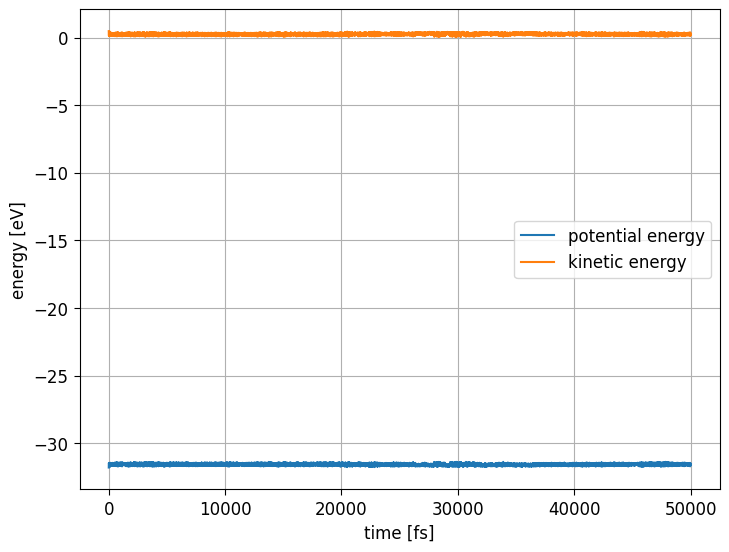

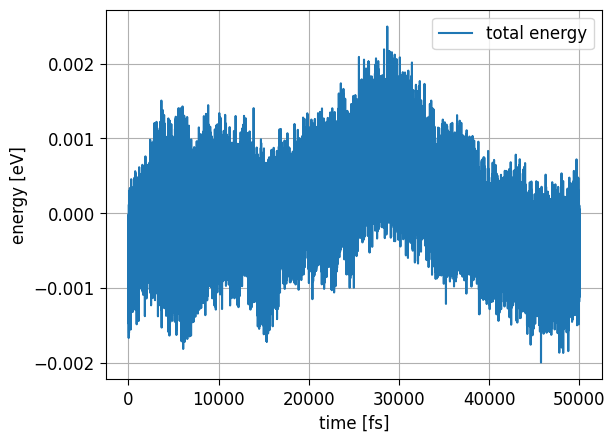

In [211]:
%matplotlib inline
plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
plt.xlabel('time [fs]')
plt.ylabel('energy [eV]')
time = np.arange(num_steps) * timestep_fs
plt.plot(time, potential_energy, label='potential energy')
plt.plot(time, kinetic_energy, label='kinetic energy')
plt.legend()
plt.grid()
plt.show()
plt.plot(time, total_energy - total_energy.mean(), label='total energy')
plt.legend()
plt.xlabel('time [fs]')
plt.ylabel('energy [eV]')
plt.grid()

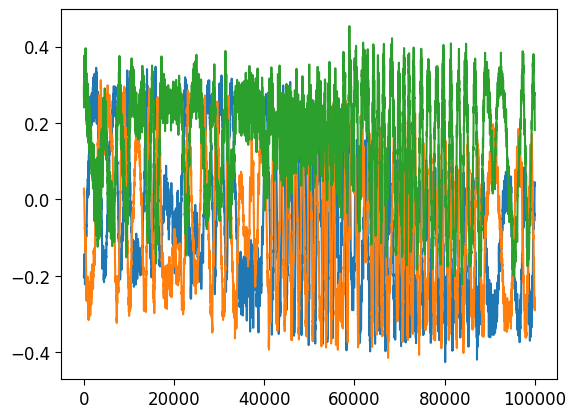

In [212]:
r = dipoles
for i in range(3):
    plt.plot(r[:,0,i])

In [213]:
from statsmodels.tsa.stattools import acovf
10**6/1000

1000.0

In [214]:
# total_dipole_vectors = total_dipole_vectors[NSKIP::]
from ase import units

# Time for speed of light in vacuum to travel 1cm (0.01) in 1fs (1e15)
jiffy = 0.01 / units._c * 1e12

# dipo_list = np.array(total_dipole_vectors)
dtime = timestep_fs * 0.001
# Frequency range in cm^-1
Nframes = len(r)
print("Nframes: ", Nframes)
Nfreq = int(Nframes / 2) + 1

freq = np.arange(Nfreq) / float(Nframes) / dtime * jiffy

# Dipole-Dipole autocorrelation function
acvx = acovf(r[:,0, 0], fft=True)
acvy = acovf(r[:,0, 1], fft=True)
acvz = acovf(r[:,0, 2], fft=True)
acv = acvx + acvy + acvz

acv = acv * np.blackman(len(r)) * 4
spectra = np.abs(np.fft.rfftn(acv)) 

Nframes:  100000


(1.0, 4000.0)

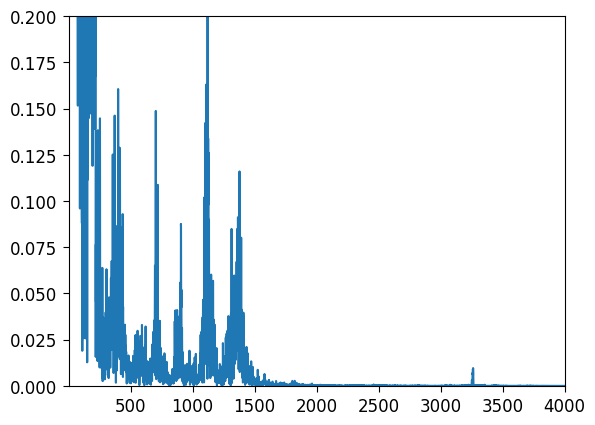

In [216]:
plt.plot(freq, spectra)
# plt.ylim(0,0.0000005)
# plt.xlim(100, 150)
# plt.yscale("log")
plt.ylim(0,0.2)
plt.xlim(1, 4000)